In [3]:
import ee 
#ee.Authenticate()
ee.Initialize()
import geemap
mymap = geemap.Map(center = [23,32], zoom = 8)
#Toushka_Coordinates
#aoi = ee.Geometry.Polygon([[[30.272572, 22.634107], [31.629166, 22.634107], [31.629166, 23.724828], [30.272572, 23.724828], [30.272572, 22.634107]]])
#Toushka_&_Lake-Nasser_Coordinates
aoi = ee.Geometry.Polygon([[[30.075478, 22.018436],[33.414372, 22.018436],[33.414372, 24.020377],[30.075478, 24.020377],[30.075478, 22.018436]]])
mymap

Map(center=[23, 32], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Tog…

In [1]:
image_name = 'Nov_2020'

## Sentinel-1 Visualization

In [3]:
SAR = ee.ImageCollection('COPERNICUS/S1_GRD') \
             .filterBounds(aoi) \
             .filterDate('2020-11-20','2020-11-30') \
             .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV')) \
             .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')) \
             .filter(ee.Filter.eq('instrumentMode', 'IW')) \
             .filter(ee.Filter.eq('platform_number', 'B'))\
             .filter(ee.Filter.eq('resolution_meters', 10)) \
             .map(lambda image: image.clip(aoi))
from iteru import get_imgCol_dates
get_imgCol_dates(SAR)

['2020-11-20',
 '2020-11-22',
 '2020-11-22',
 '2020-11-24',
 '2020-11-24',
 '2020-11-27',
 '2020-11-29',
 '2020-11-29']

In [4]:
SAR = SAR.select('VV').median().clip(aoi)
mymap.add_ee_layer(SAR.select('VV'), {'min': -40, 'max': 5}, 'SAR VV')

## Sentinel-2 Visualization

In [5]:
sent_2_date = '2020-11-20','2020-11-30'
SENT= ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")\
                           .filterBounds(aoi)\
                           .filterDate(*sent_2_date)\
                           .filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', 5)\
                           .map(lambda image: image.clip(aoi))
get_imgCol_dates(SENT)

['2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-21',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-24',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-26',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29',
 '2020-11-29']

In [6]:
RGB = ee.Image.rgb(SENT.select('B4').mosaic(), SENT.select('B3').mosaic(), SENT.select('B2').mosaic())
mymap.add_ee_layer(RGB, vis_params={'min':0, 'max':5000}, name='RGB')

## Panchromatic Band

In [7]:
SENT= ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")\
                           .filterBounds(aoi)\
                           .filterDate(*sent_2_date)\
                           .filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', 5)\
                           .map(lambda image: image.clip(aoi))
mymap.add_ee_layer(SENT.select('B8') , {'min': 0, 'max': 7000}, 'Sentinel-2 B8')

## Sentine-2 Water Mask

In [8]:
MASK = SENT.mosaic().select(['B3', 'B8'])
NDWI = MASK.normalizedDifference(['B3', 'B8']).rename('NDWI')
NDWI_MASK= NDWI.updateMask(NDWI.gte(0))
mymap.add_ee_layer(NDWI_MASK, vis_params={'min':0, 'max':1, 'palette':['00FFFF', '0000FF']}, name='NDWI')

## DEM 

In [9]:
#DEM = ee.ImageCollection("projects/sat-io/open-datasets/FABDEM").filterBounds(aoi).select('b1').mosaic().clip(aoi)
#vis = {'min': 78, 'max': 387, 'palette': ['0000ff', '00ffff', 'ffff00', 'ff0000', 'ffffff'] , 'opacity': 1, 'bands': ['b1']}
#mymap.add_ee_layer(DEM, vis, 'DEM')

## Download

In [10]:
# Download Sentinel-1
geemap.download_ee_image(SAR.select('VV'),
                        filename=f"raw/sentinel_1/{image_name}.tif",
                        scale=30,
                        region=aoi,
                        crs='EPSG:3857')

Nov_2020.tif: |          | 0.00/804M (raw) [  0.0%] in 00:00 (eta:     ?)

There is no STAC entry for: None


In [11]:
# Download Sentinel-2
geemap.download_ee_image(RGB.select(['vis-red']), 
                        filename=f"raw/bands/{image_name}_RED.tif",
                        scale=30,
                        region=aoi,
                        crs='EPSG:3857')
geemap.download_ee_image(RGB.select(['vis-green']), 
                        filename=f"raw/bands/{image_name}_GREEN.tif",
                        scale=30,
                        region=aoi,
                        crs='EPSG:3857')
geemap.download_ee_image(RGB.select(['vis-blue']), 
                        filename=f"raw/bands/{image_name}_BLUE.tif",
                        scale=30,
                        region=aoi,
                        crs='EPSG:3857')

Nov_2020_RED.tif: |          | 0.00/201M (raw) [  0.0%] in 00:00 (eta:     ?)

Nov_2020_GREEN.tif: |          | 0.00/201M (raw) [  0.0%] in 00:00 (eta:     ?)

Nov_2020_BLUE.tif: |          | 0.00/201M (raw) [  0.0%] in 00:00 (eta:     ?)

In [12]:
import cv2
import numpy as np
red = cv2.imread(f'raw/bands/{image_name}_RED.tif',-1)
green = cv2.imread(f'raw/bands/{image_name}_GREEN.tif',-1)
blue = cv2.imread(f'raw/bands/{image_name}_BLUE.tif',-1)
rgb = np.dstack((blue,green,red))
cv2.imwrite(f'raw/sentinel_2/{image_name}.tif',rgb)

True

In [13]:
# Download B8 
geemap.download_ee_image(SENT.mosaic().select('B8'),
                        filename=f"raw/B8/{image_name}.tif",
                        scale=30,
                        region=aoi,
                        crs='EPSG:3857')

Nov_2020.tif: |          | 0.00/201M (raw) [  0.0%] in 00:00 (eta:     ?)

In [14]:
# Download Water Mask
geemap.download_ee_image(NDWI_MASK.select('NDWI'),
                        filename=f"raw/mask/{image_name}.tif",
                        scale=30,
                        region=aoi,
                        crs='EPSG:3857')

Nov_2020.tif: |          | 0.00/402M (raw) [  0.0%] in 00:00 (eta:     ?)

In [15]:
# Download DEM
#geemap.download_ee_image(DEM,filename=f"raw/dem/{image_name}.tif",scale=30,region=aoi,crs='EPSG:3857')

## SAR Preprocess

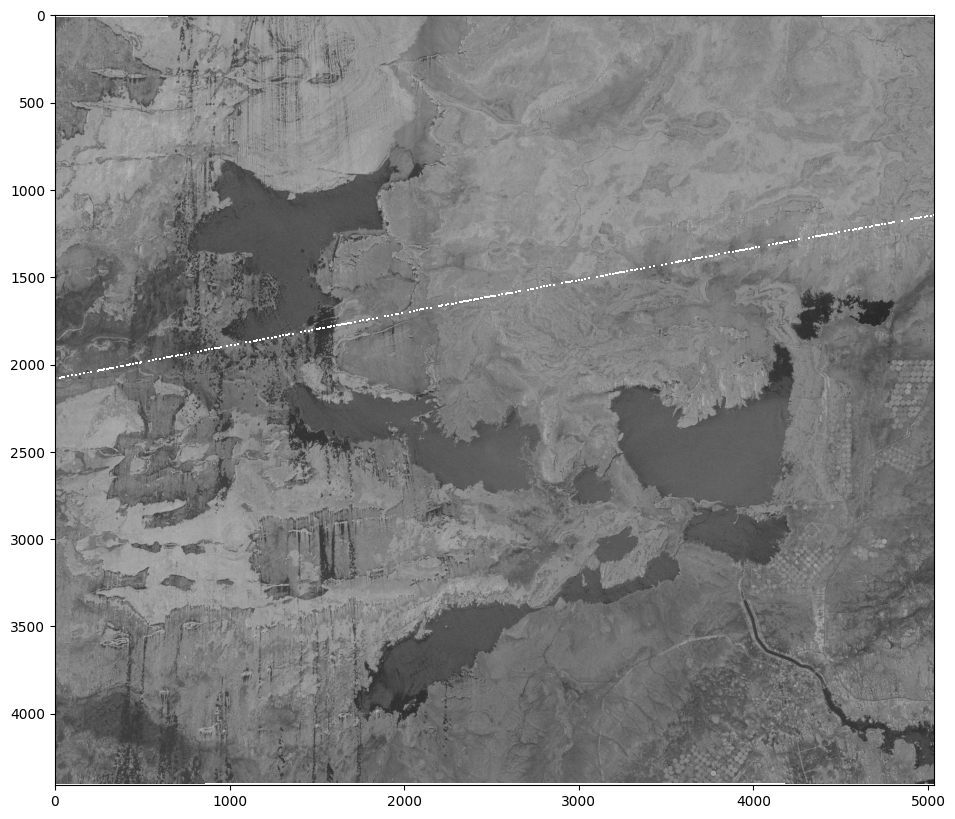

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage
import imageio.v2 as imageio
from glob import glob
aoi_name = image_name
sar = cv2.imread(f'raw/sentinel_1/{aoi_name}.tif', -1)
plt.figure(figsize=(15,10))
plt.imshow(sar, cmap='gray')
plt.show()

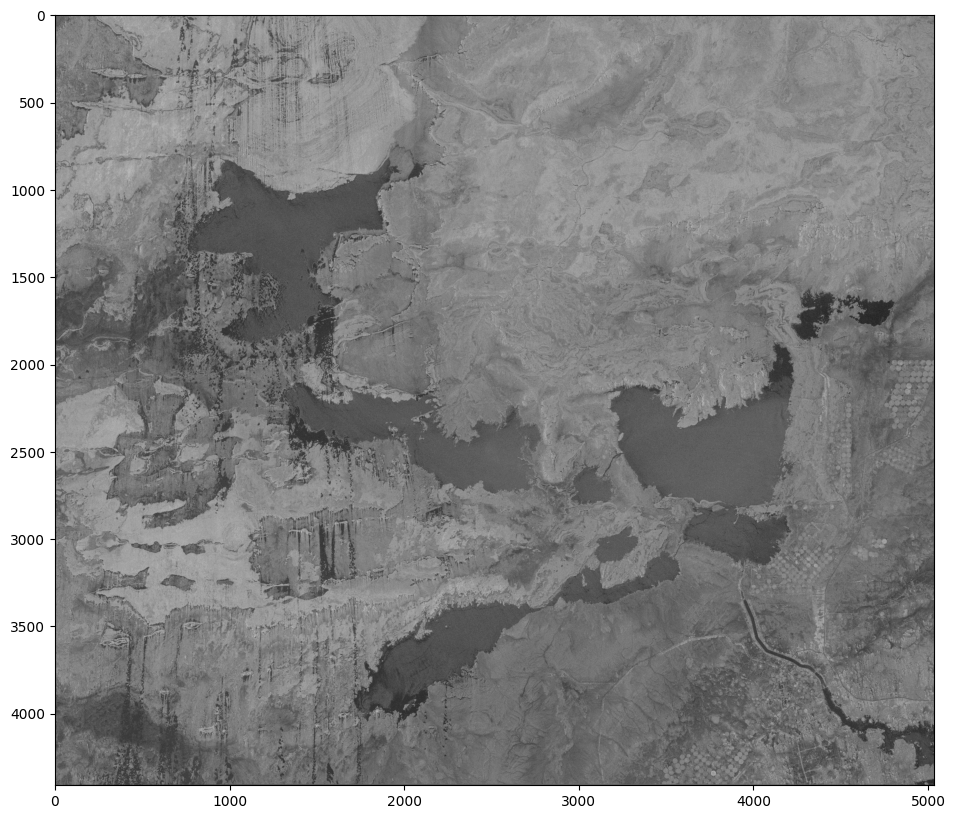

In [3]:
mask = np.isnan(sar)
masked_sar = sar.copy()
masked_sar[mask] = np.interp(np.flatnonzero(mask), np.flatnonzero(~mask), sar[~mask])
plt.figure(figsize=(15,10))
plt.imshow(masked_sar, cmap='gray')
plt.show()

In [18]:
masked_sar.min(), masked_sar.max()

(-43.87164816878083, 13.28651264247262)

In [19]:
upper_percentile = np.percentile(masked_sar, 98)
lower_percentile = np.percentile(masked_sar, 2)
clipped_sar = np.clip(masked_sar, lower_percentile, upper_percentile)
clipped_sar.min(), clipped_sar.max()

(-28.140721071370635, -4.932688134471387)

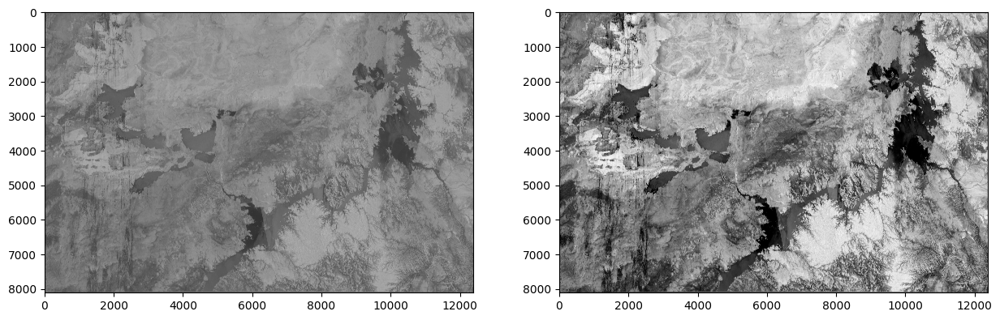

In [20]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(masked_sar, cmap='gray')
plt.subplot(1,2,2)
plt.imshow(clipped_sar, cmap='gray')
plt.show()

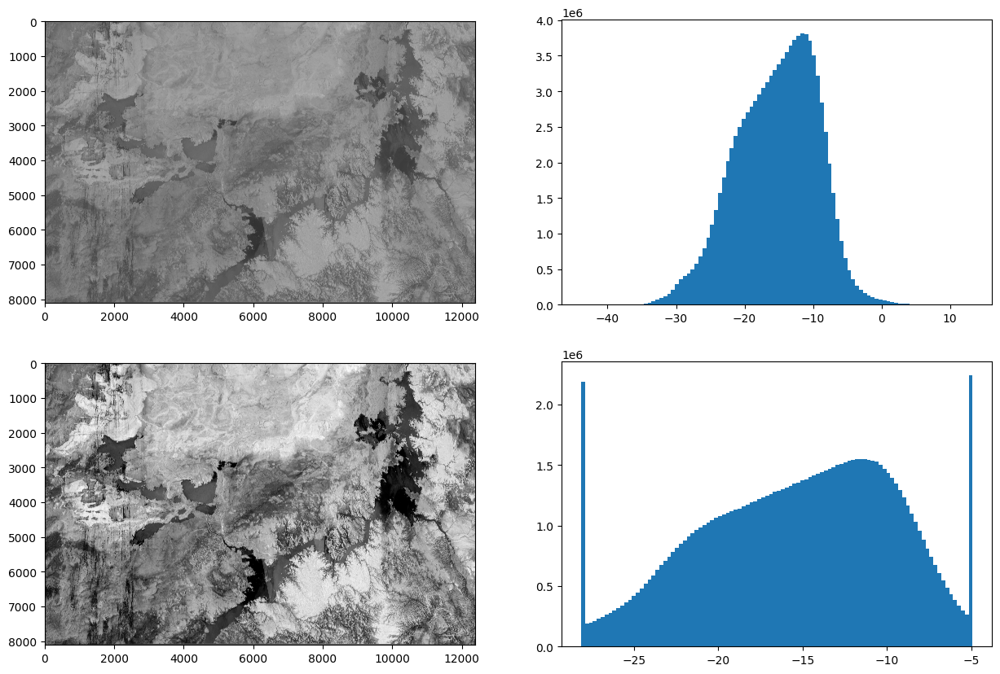

In [21]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(masked_sar, cmap='gray')
plt.subplot(2,2,2)
plt.hist(masked_sar.flatten(), bins=100)
plt.subplot(2,2,3)
plt.imshow(clipped_sar, cmap='gray')
plt.subplot(2,2,4)
plt.hist(clipped_sar.flatten(), bins=100)
plt.show()

In [22]:
clipped_sar.min(), clipped_sar.max()

(-28.140721071370635, -4.932688134471387)

In [23]:
f16_sar = clipped_sar.astype(np.float16)

In [24]:
f16_sar.min(), f16_sar.max()

(-28.14, -4.934)

In [25]:
import imageio.v2 as imageio
imageio.imwrite(f'preprocess/sentinel_1/{aoi_name}_VV.tif', f16_sar)

In [26]:
test = imageio.imread(f'preprocess/sentinel_1/{aoi_name}_VV.tif')

In [27]:
test.min(), test.max()

(-28.14, -4.934)

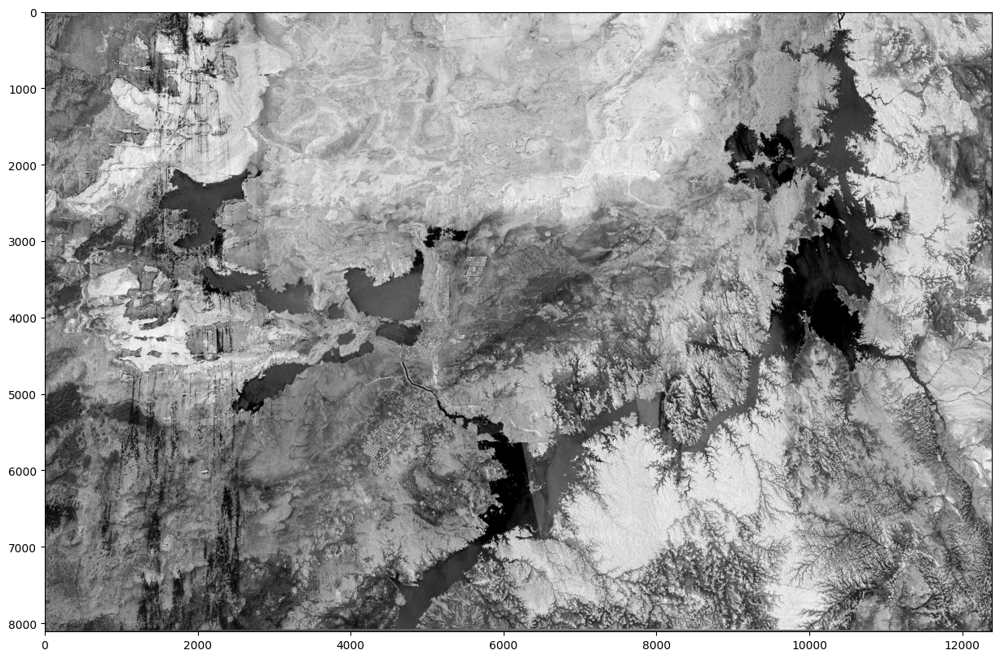

In [28]:
plt.figure(figsize=(15,10))
plt.imshow(test, cmap='gray')
plt.show()

## RGB Preprocess

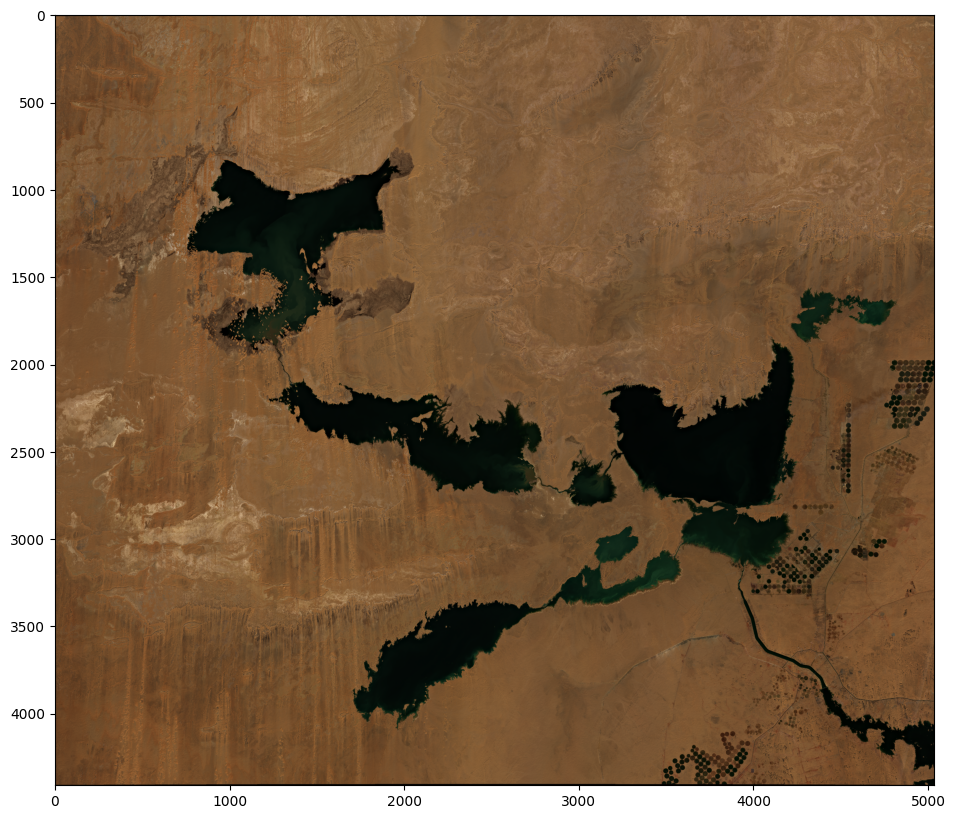

In [5]:
rgb = cv2.imread(f'raw/sentinel_2/{aoi_name}.tif',-1)
rgb_normalized = cv2.normalize(rgb, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
plt.figure(figsize=(15,10))
plt.imshow(rgb_normalized[:,:,::-1])
plt.show()

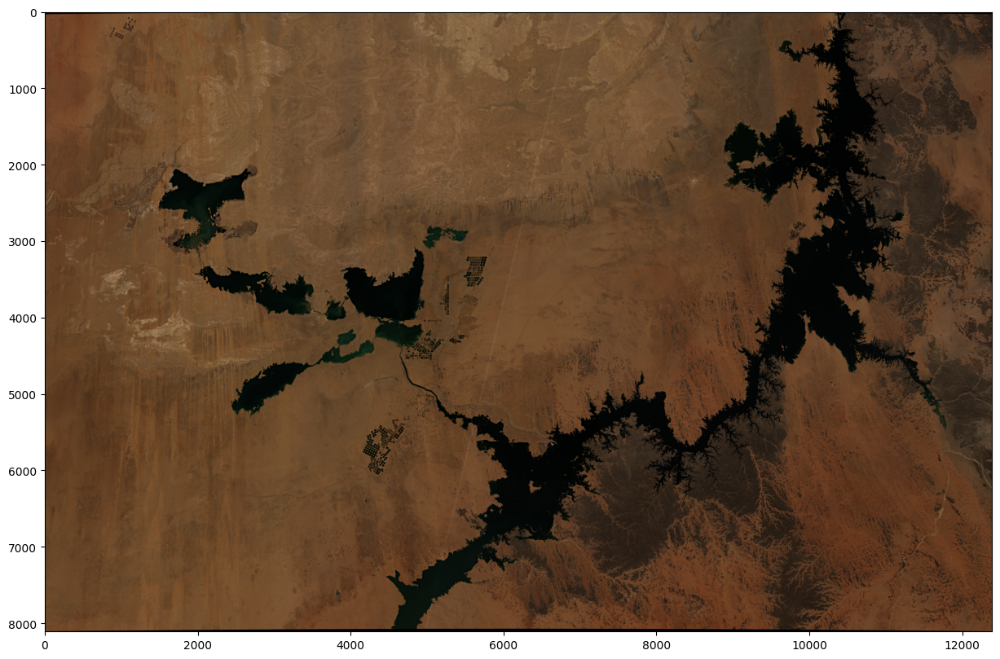

In [30]:
cv2.imwrite(f"preprocess/sentinel_2/{aoi_name}.tif", rgb_normalized)
test_rgb = cv2.imread(f'preprocess/sentinel_2/{aoi_name}.tif',-1)
plt.figure(figsize=(15,10))
plt.imshow(test_rgb[:,:,::-1])
plt.show()

In [31]:
x = test_rgb == rgb_normalized
np.all(x == True)

True

## B8 Preprocess

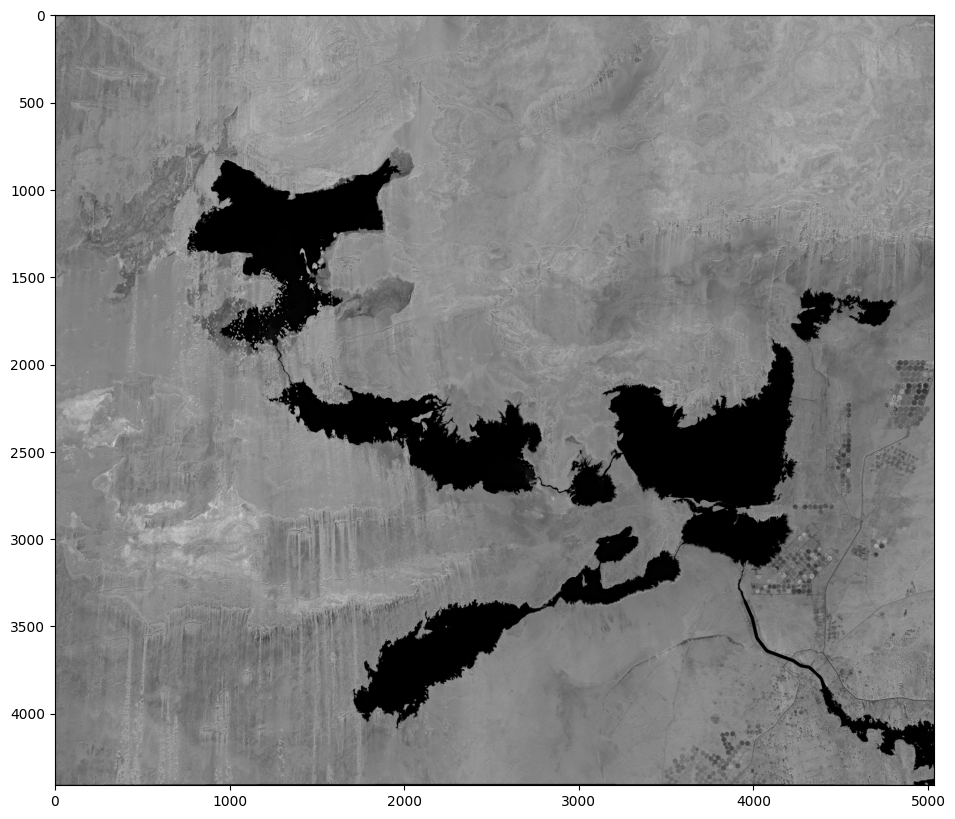

In [4]:
b8 = cv2.imread(f'raw/b8/{aoi_name}.tif', -1)
plt.figure(figsize=(15, 10))
plt.imshow(b8, cmap='gray')
plt.show()

In [33]:
b8.min(), b8.max()

(0, 11248)

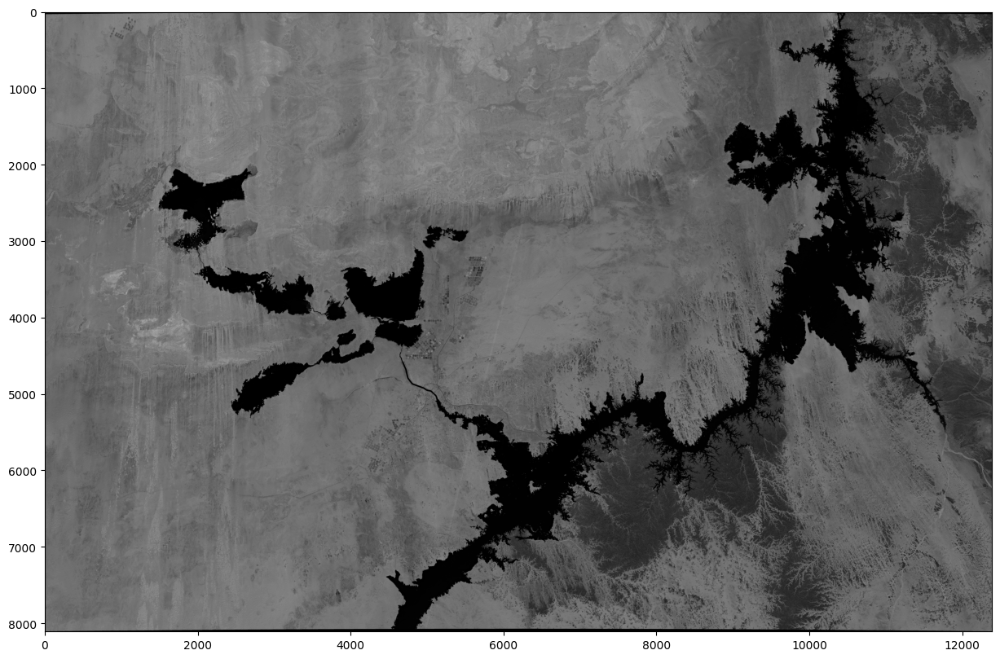

In [34]:
b8_normalized = cv2.normalize(b8, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
plt.figure(figsize=(15, 10))
plt.imshow(b8_normalized, cmap='gray')
plt.show()

In [35]:
b8_normalized.min(), b8_normalized.max()

(0, 255)

In [36]:
cv2.imwrite(f'preprocess/b8/{aoi_name}.tif', b8_normalized)
test_b8 = cv2.imread(f'preprocess/b8/{aoi_name}.tif', -1)
x = test_b8 == b8_normalized
np.all(x == True)

True

## Mask Preprocess

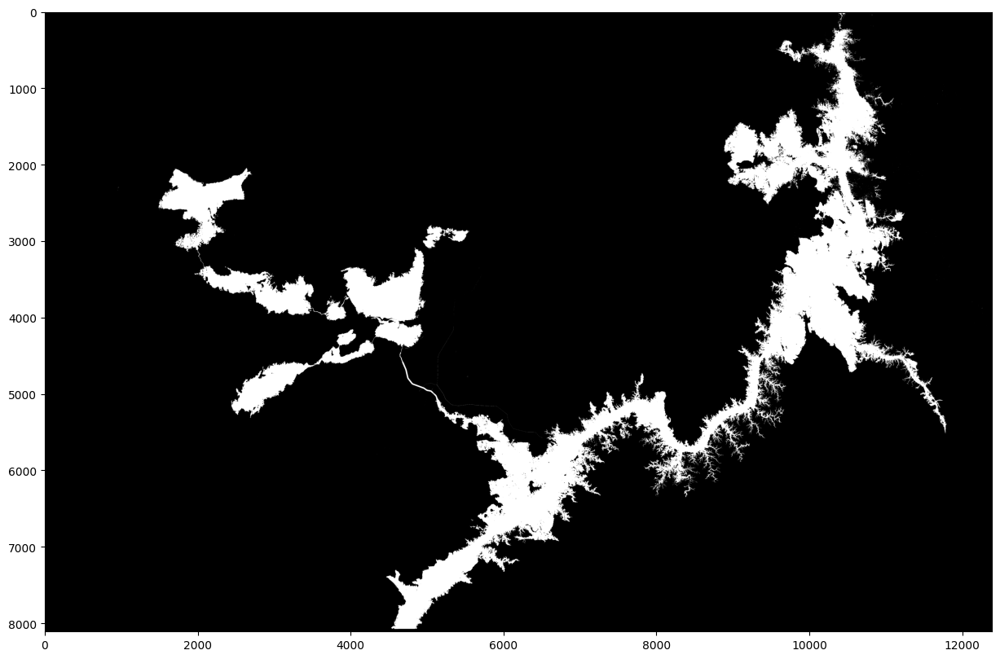

In [37]:
mask = cv2.imread(f"raw/mask/{image_name}.tif", -1)
nan_mask = np.isnan(mask)
mask[nan_mask] = 0
mask_refined = np.where(mask > 0, 1, 0)
plt.figure(figsize=(15, 10))
plt.imshow(mask_refined, cmap="gray")
plt.show()

In [38]:
mask_refined_8 = mask_refined.astype(np.uint8)
mask_refined_8.dtype

dtype('uint8')

In [39]:
np.any(mask_refined_8 == mask_refined)

True

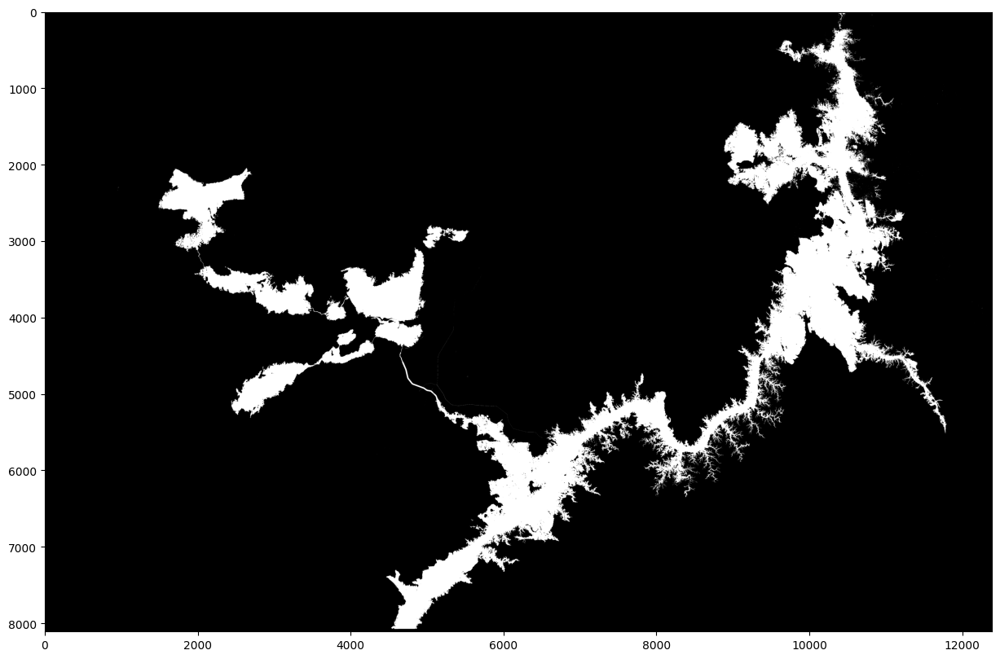

In [40]:
plt.figure(figsize=(15, 10))
plt.imshow(mask_refined_8, cmap="gray")
plt.show()

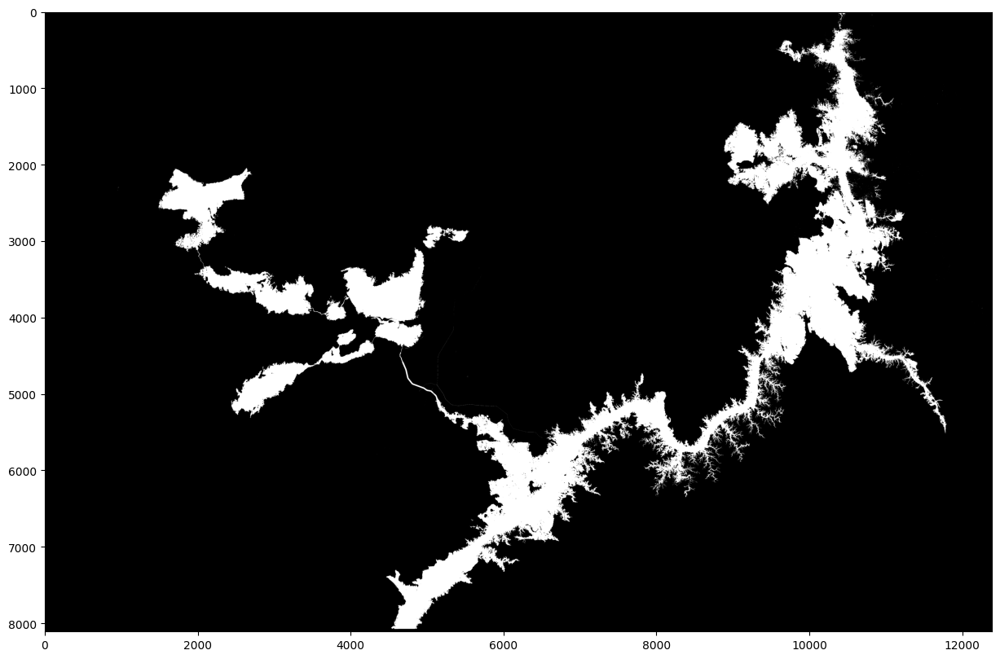

In [41]:
cv2.imwrite(f"preprocess/mask/{image_name}.tif", mask_refined_8)
test_mask = cv2.imread(f"preprocess/mask/{image_name}.tif", -1)
plt.figure(figsize=(15, 10))   
plt.imshow(test_mask, cmap="gray")
plt.show()

## DEM Preprocess

In [6]:
dem = cv2.imread(f"raw/dem/DEM.tif", -1)

In [8]:
dem.min(), dem.max()

(nan, nan)

In [9]:
dem_mask = np.isnan(dem)
dem[dem_mask] = np.interp(np.flatnonzero(dem_mask), np.flatnonzero(~dem_mask), dem[~dem_mask])

In [10]:
dem.min(), dem.max()

(78.18, 645.5)

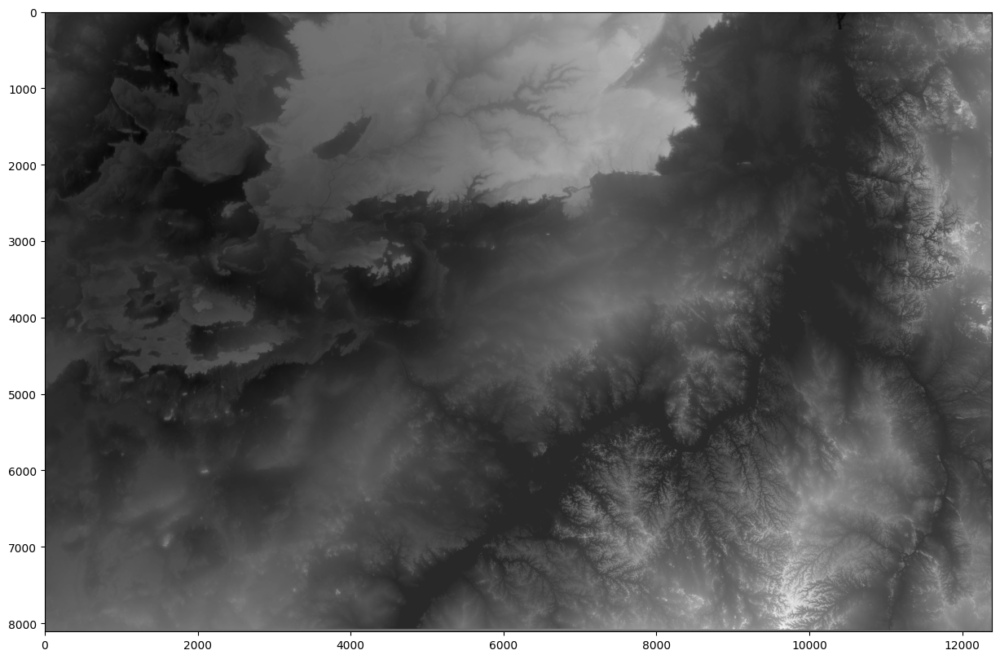

In [11]:
plt.figure(figsize=(15, 10))
plt.imshow(dem, cmap="gray")
plt.show()

In [12]:
imageio.imwrite(f"preprocess/dem/DEM.tif", dem)